<a href="https://colab.research.google.com/github/Dmytro-Ostrenko/Data09/blob/AI_test/CNN84.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import tensorflow as tf
from tensorflow.keras import datasets, layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
import os
import matplotlib.pyplot as plt
import json

# Завантаження датасету CIFAR-10
(train_images, train_labels), (test_images, test_labels) = datasets.cifar10.load_data()

# Нормалізація зображень
train_images, test_images = train_images / 255.0, test_images / 255.0

# Розширення навчальної множини
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    vertical_flip=False,
    zoom_range=0.2,
    shear_range=0.2
)
datagen.fit(train_images)

# Функція побудови моделі з фіксованими гіперпараметрами
def build_model():
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(32, 32, 3))

    x = base_model.output
    x = GlobalAveragePooling2D()(x)

    # Фіксовані гіперпараметри
    units = 1024
    dropout_rate = 0.3
    learning_rate = 1e-3

    x = Dense(units=units, activation='relu')(x)
    x = layers.Dropout(dropout_rate)(x)

    predictions = Dense(10, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=predictions)

    model.compile(optimizer=Adam(learning_rate=learning_rate),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    return model

# Створення моделі
model = build_model()

# Колбеки для збереження найкращої моделі та ранньої зупинки
checkpoint = tf.keras.callbacks.ModelCheckpoint('best_model.keras', monitor='val_accuracy', save_best_only=True, mode='max')
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=10, mode='max', restore_best_weights=True)

# Навчання моделі
history = model.fit(datagen.flow(train_images, train_labels, batch_size=64),
                    epochs=30,
                    validation_data=(test_images, test_labels),
                    callbacks=[checkpoint, early_stopping])

# Збереження історії тренування
with open('training_history.json', 'w') as f:
    json.dump(history.history, f)

# Оцінка точності моделі
test_loss, test_acc = model.evaluate(test_images, test_labels, verbose=2)
print(f"Точність моделі: {test_acc:.4f}")


170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 11s 0us/step
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step
Epoch 1/30


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


782/782 ━━━━━━━━━━━━━━━━━━━━ 71s 75ms/step - accuracy: 0.1767 - loss: 2.0877 - val_accuracy: 0.2427 - val_loss: 1.8487
Epoch 2/30
782/782 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - accuracy: 0.2660 - loss: 1.8170 - val_accuracy: 0.3787 - val_loss: 1.5532
Epoch 3/30
782/782 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - accuracy: 0.3983 - loss: 1.5383 - val_accuracy: 0.4524 - val_loss: 1.5104
Epoch 4/30
782/782 ━━━━━━━━━━━━━━━━━━━━ 86s 72ms/step - accuracy: 0.4970 - loss: 1.3531 - val_accuracy: 0.6054 - val_loss: 1.1003
Epoch 5/30
782/782 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - accuracy: 0.5791 - loss: 1.1872 - val_accuracy: 0.6541 - val_loss: 1.0068
Epoch 6/30
782/782 ━━━━━━━━━━━━━━━━━━━━ 82s 71ms/step - accuracy: 0.6337 - loss: 1.0597 - val_accuracy: 0.6893 - val_loss: 0.9063
Epoch 7/30
782/782 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - accuracy: 0.6650 - loss: 0.9717 - val_accuracy: 0.6979 - val_loss: 0.8752
Epoch 8/30
782/782 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - accuracy: 0.6890 - loss: 0.9215 - val_accurac

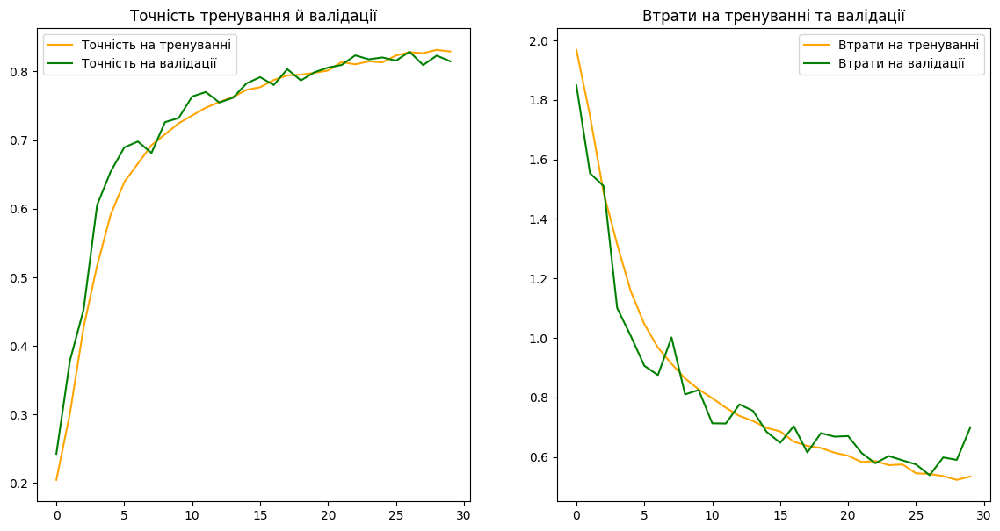

In [ ]:
import matplotlib.pyplot as plt

# створення графіків точності й втрат
def plot_accuracy_loss(history, test_loss, test_acc):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(len(acc))

    plt.figure(figsize=(14, 7))

    # графік точності
    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, 'orange', label='Точність на тренуванні')
    plt.plot(epochs, val_acc, 'green', label='Точність на валідації')
    plt.title('Точність тренування й валідації')
    plt.legend()

    # графік втрат
    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, 'orange', label='Втрати на тренуванні')
    plt.plot(epochs, val_loss, 'green', label='Втрати на валідації')
    plt.title('Втрати на тренуванні та валідації')
    plt.legend()

    plt.show()

# відображення результатів
plot_accuracy_loss(history, test_loss, test_acc)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


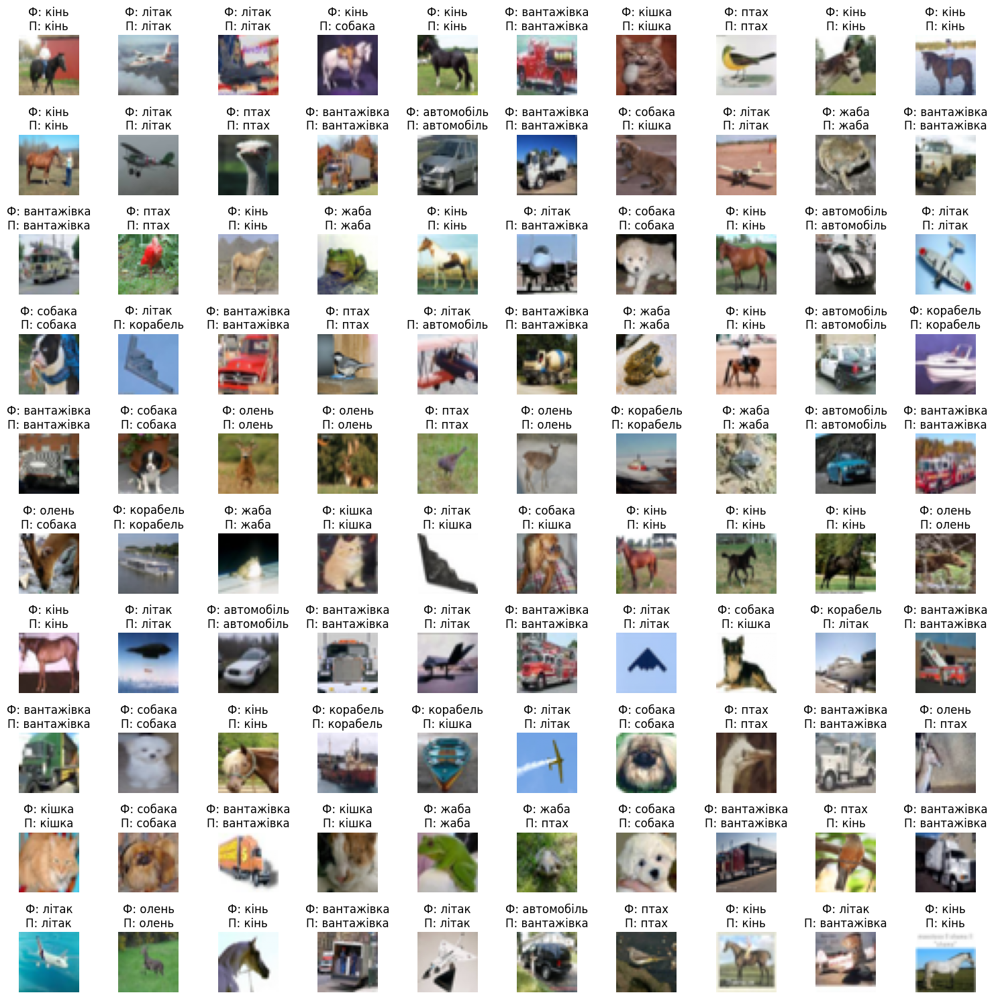

Точність на вибіркових зображеннях: 84.0 %


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# назви класів cifar-10
class_labels = ['літак', 'автомобіль', 'птах', 'кішка', 'олень', 'собака', 'жаба', 'кінь', 'корабель', 'вантажівка']

# вибір 100 випадкових зображень з тестової вибірки CIFAR-10
indices = np.random.choice(len(test_images), 100, replace=False)
sample_images = test_images[indices]
sample_labels = test_labels[indices]

# прогнозування міток для цих зображень за допомогою моделі
predictions = model.predict(sample_images)
predicted_labels = np.argmax(predictions, axis=1)

# виведення зображень та передбачень
fig, axes = plt.subplots(10, 10, figsize=(15, 15))
axes = axes.flatten()

for i, (image, true_label, predicted_label) in enumerate(zip(sample_images, sample_labels, predicted_labels)):
    axes[i].imshow(image)
    true_class = class_labels[true_label[0]]
    predicted_class = class_labels[predicted_label]
    axes[i].set_title(f"Ф: {true_class}\nП: {predicted_class}") # П-прогнозування, Ф-фактичне на картинці
    axes[i].axis('off')

plt.tight_layout()
plt.show()

# розрахунок точності прогнозу на отриманих зображеннях
correct_predictions = np.sum(predicted_labels == sample_labels.flatten())
total_predictions = len(sample_labels)
accuracy_on_sample = correct_predictions / total_predictions

# виведення точності прогнозу на зразках
print(f"Точність на вибіркових зображеннях: {accuracy_on_sample * 100:.1f} %")


In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True) # Force remount to refresh credentials

Mounted at /content/drive


In [ ]:
model.save('/content/drive/MyDrive/my_cnn_model5.keras')

**Запустити модель**

In [12]:
from tensorflow.keras.models import load_model
model = load_model('/content/drive/MyDrive/my_cnn_model5.keras')

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [6]:
from google.colab import files
files.download('/content/drive/MyDrive/my_cnn_model5.keras')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saving airplane1.jpg to airplane1.jpg
Saving airplane2.jpg to airplane2.jpg
Saving airplane3.jpg to airplane3.jpg
Saving airplane4.jpg to airplane4.jpg
Saving airplane5.jpg to airplane5.jpg
Saving airplane6.jpg to airplane6.jpg
Saving airplane7.jpg to airplane7.jpg
Saving airplane8.png to airplane8.png
Saving airplane9.jpg to airplane9.jpg
Saving airplane10.jpg to airplane10.jpg
Saving airplane11.jpg to airplane11.jpg
Saving airplane12.jpg to airplane12.jpg
Saving airplane13.jpg to airplane13.jpg
Saving airplane14.jpg to airplane14.jpg
Saving airplane15.jpg to airplane15.jpg
Saving airplane16.jpg to airplane16.jpg
Saving airplane17.png to airplane17.png
Saving airplane18.jpg to airplane18.jpg
Saving airplane19.jpg to airplane19.jpg
Saving airplane20.jpg to airplane20.jpg
Saving airplane21.jpg to airplane21.jpg
Saving airplane22.jpg to airplane22.jpg
Saving airplane23.jpg to airplane23.jpg
Saving airplane24.jpg to airplane24.jpg
Saving airplane25.jpg to airplane25.jpg


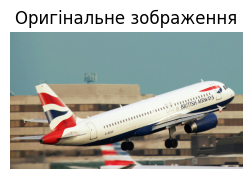

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
На картинці зображено літак із вірогідністю у 99.98%


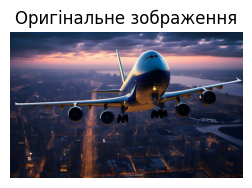

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
Впевненість середня (75.20%). Застосування стандартних фільтрів...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


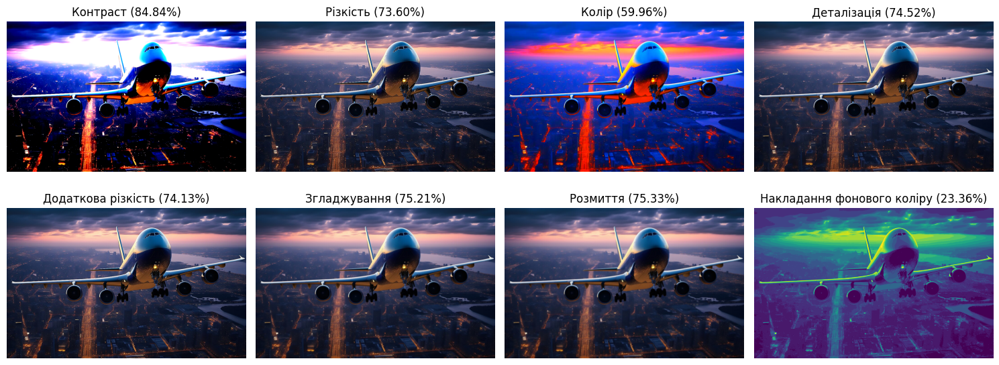

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
Фільтр 'Контраст' допоміг: вантажівка із вірогідністю 84.84%


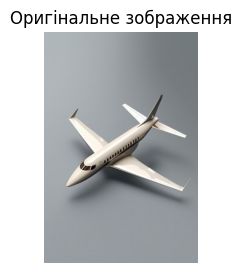

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
Впевненість середня (74.92%). Застосування стандартних фільтрів...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


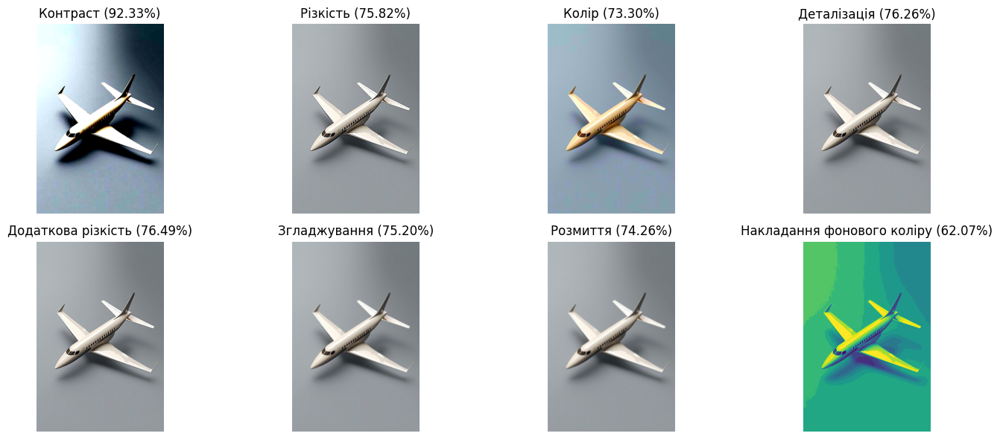

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
Фільтр 'Контраст' допоміг: літак із вірогідністю 92.33%


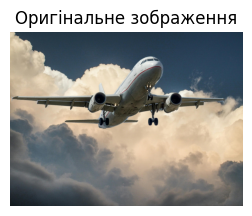

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
Впевненість середня (77.80%). Застосування стандартних фільтрів...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


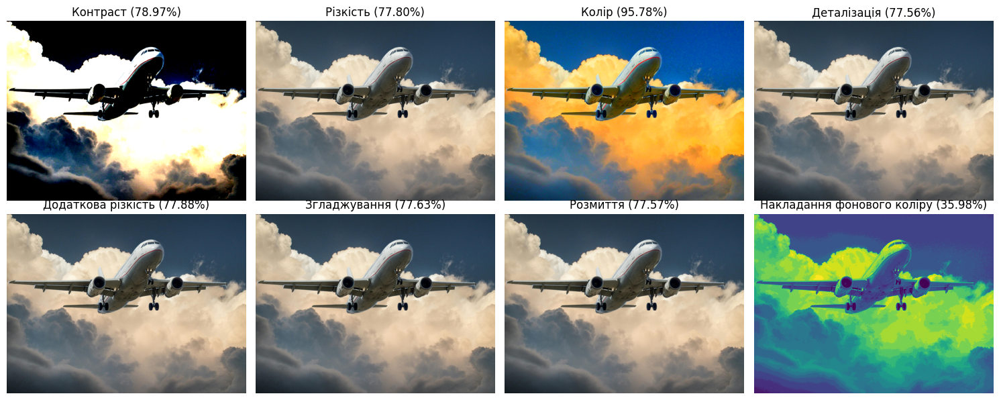

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
Фільтр 'Колір' допоміг: літак із вірогідністю 95.78%


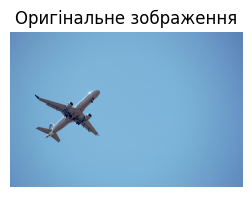

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
Впевненість середня (52.16%). Застосування стандартних фільтрів...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


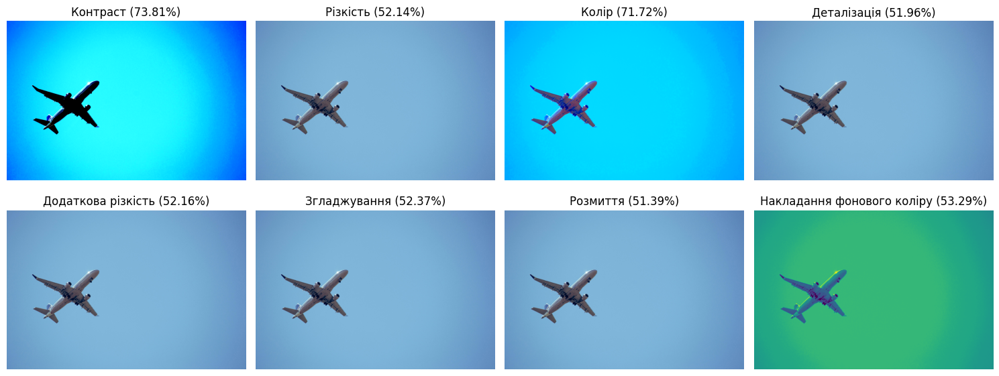

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
Зображення не підходить для класифікації навіть після застосування фільтрів.


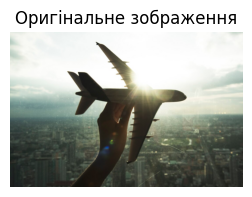

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
Впевненість середня (61.21%). Застосування стандартних фільтрів...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


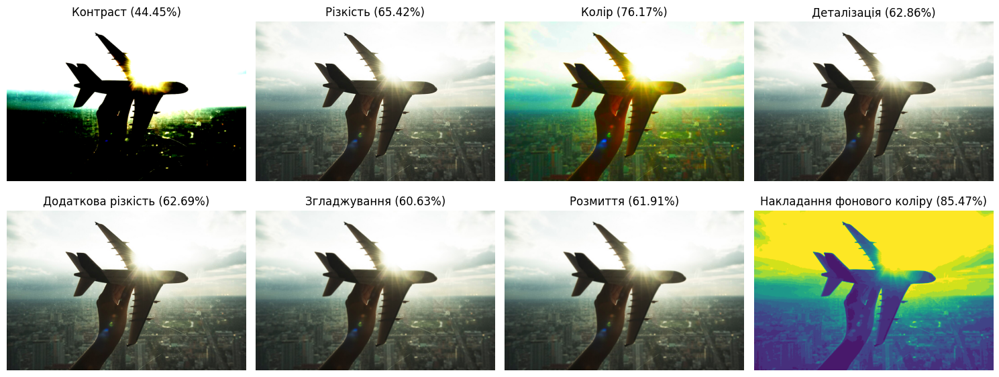

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
Фільтр 'Накладання фонового коліру' допоміг: літак із вірогідністю 85.47%


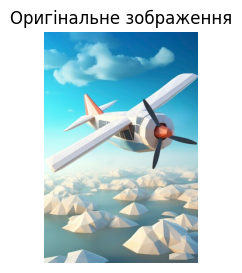

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
Впевненість середня (67.79%). Застосування стандартних фільтрів...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


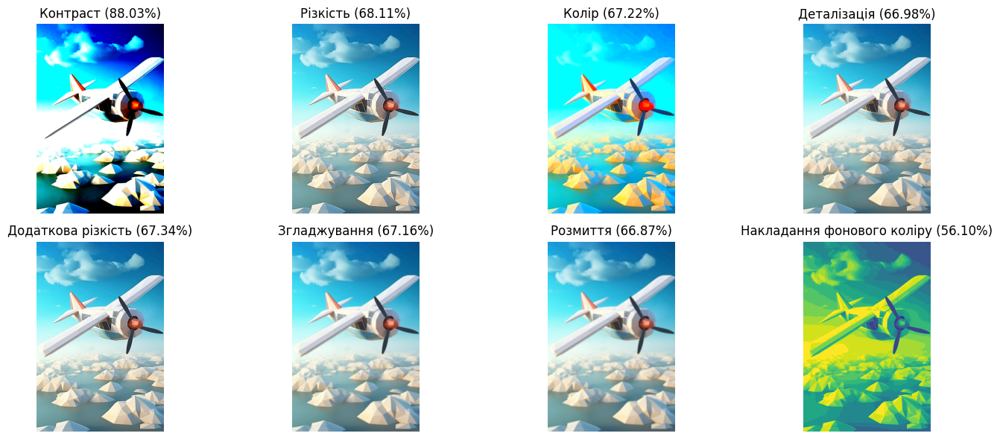

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step
Фільтр 'Контраст' допоміг: літак із вірогідністю 88.03%


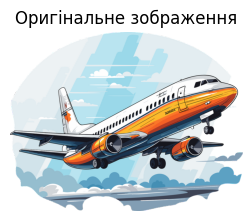

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step
На картинці зображено літак із вірогідністю у 96.97%


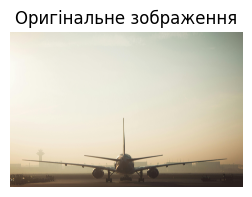

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
Впевненість середня (63.89%). Застосування стандартних фільтрів...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


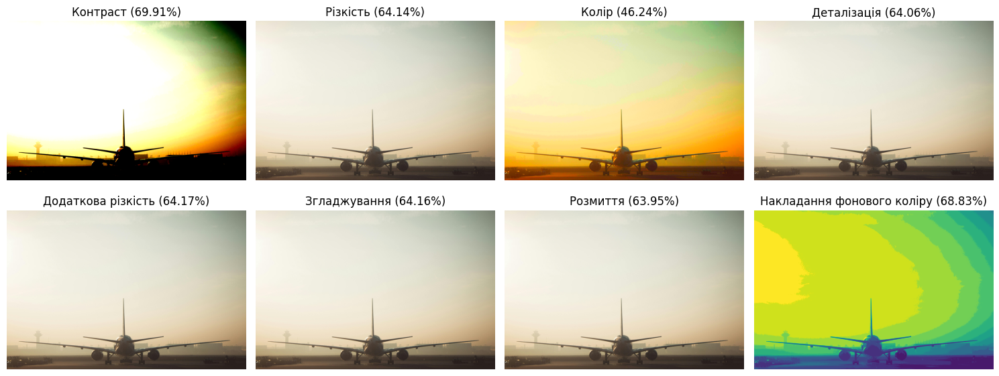

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
Зображення не підходить для класифікації навіть після застосування фільтрів.


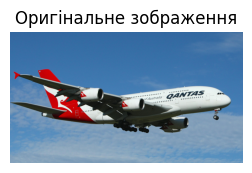

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
На картинці зображено літак із вірогідністю у 99.99%


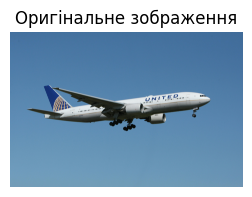

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
На картинці зображено літак із вірогідністю у 99.76%


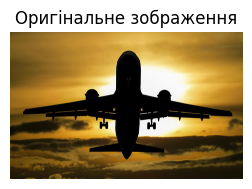

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
На картинці зображено літак із вірогідністю у 99.93%


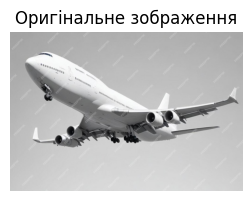

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
На картинці зображено літак із вірогідністю у 99.84%


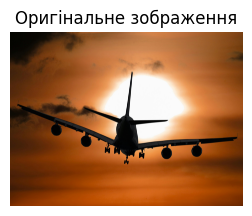

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
Впевненість середня (66.56%). Застосування стандартних фільтрів...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


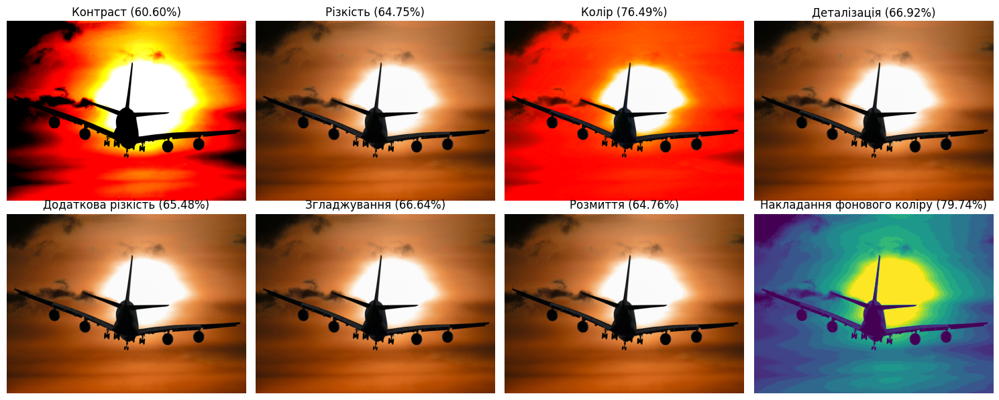

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
Зображення не підходить для класифікації навіть після застосування фільтрів.


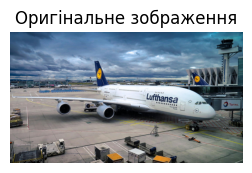

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
На картинці зображено літак із вірогідністю у 99.43%


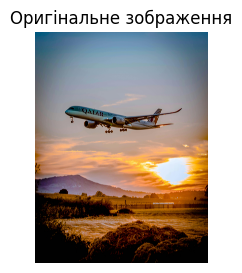

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
Впевненість середня (76.64%). Застосування стандартних фільтрів...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


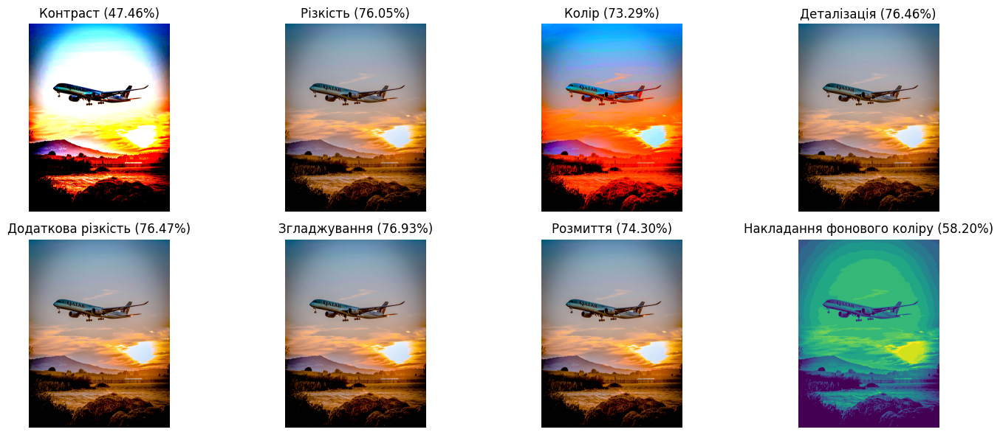

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
Зображення не підходить для класифікації навіть після застосування фільтрів.


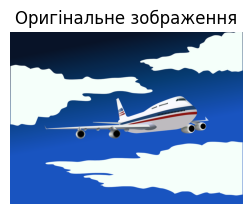

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
Впевненість середня (62.10%). Застосування стандартних фільтрів...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


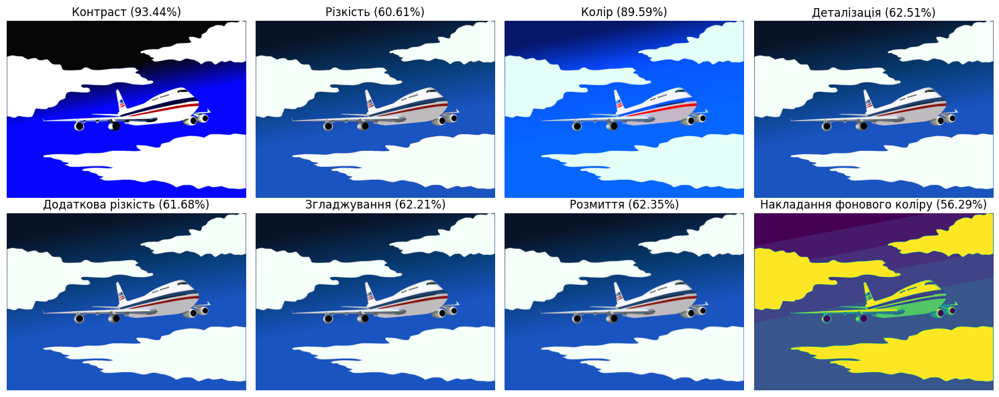

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
Фільтр 'Контраст' допоміг: літак із вірогідністю 93.44%


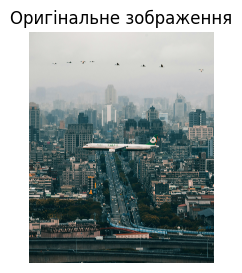

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
Низька впевненість (34.15%). Застосування альтернативних фільтрів...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


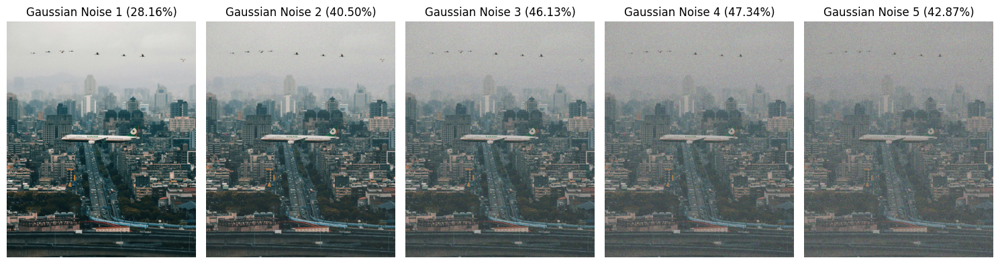

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
Зображення не підходить для класифікації навіть після застосування альтернативних фільтрів.


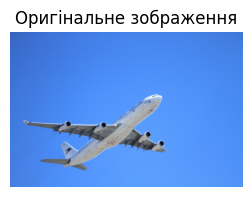

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
Впевненість середня (78.47%). Застосування стандартних фільтрів...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


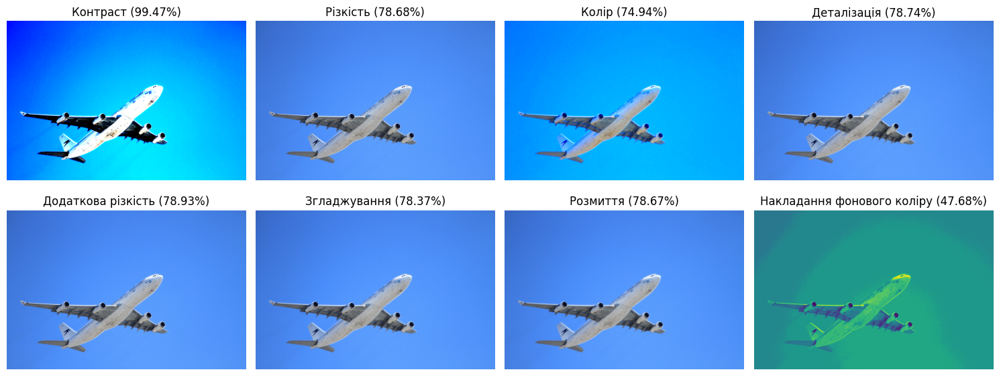

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step
Фільтр 'Контраст' допоміг: літак із вірогідністю 99.47%


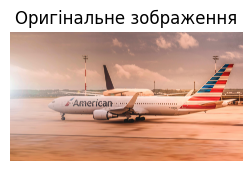

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
Впевненість середня (79.57%). Застосування стандартних фільтрів...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


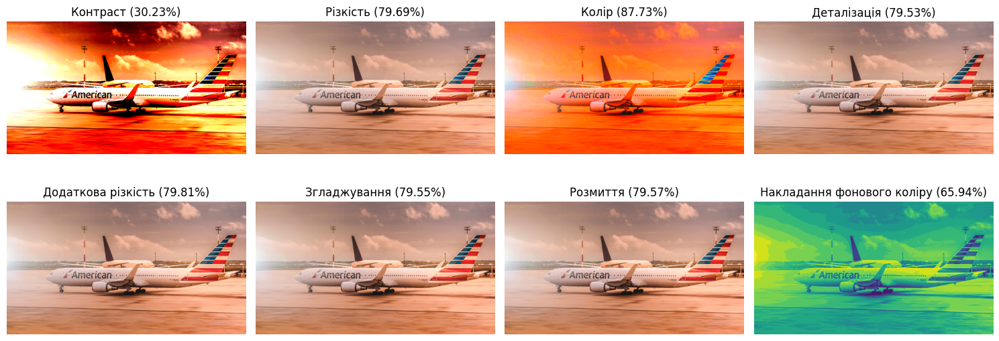

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
Фільтр 'Колір' допоміг: літак із вірогідністю 87.73%


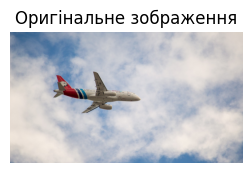

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
Низька впевненість (30.36%). Застосування альтернативних фільтрів...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


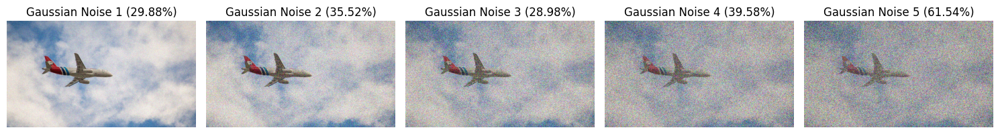

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
Зображення не підходить для класифікації навіть після застосування альтернативних фільтрів.


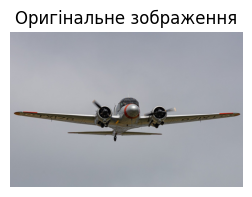

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step
На картинці зображено літак із вірогідністю у 97.14%


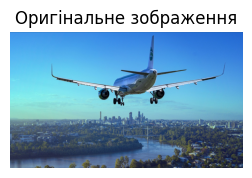

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
На картинці зображено літак із вірогідністю у 93.09%


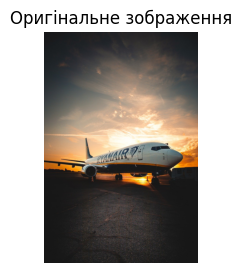

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
Впевненість середня (54.33%). Застосування стандартних фільтрів...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


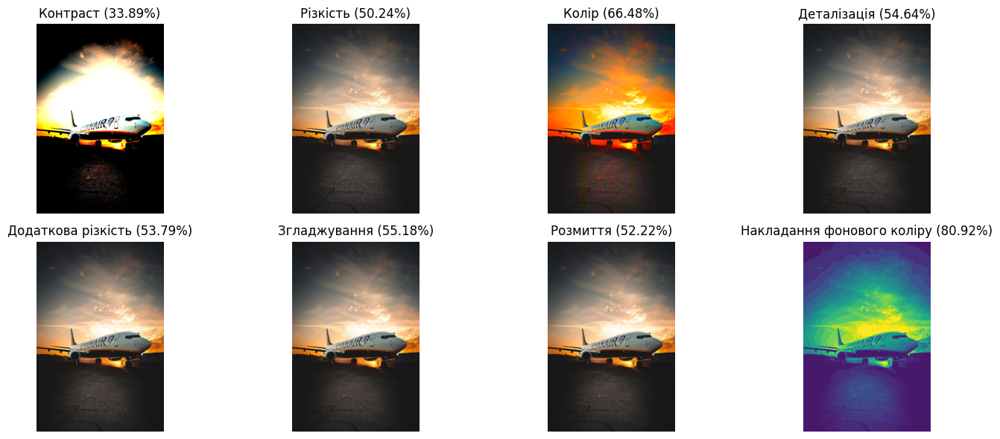

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
Фільтр 'Накладання фонового коліру' допоміг: автомобіль із вірогідністю 80.92%


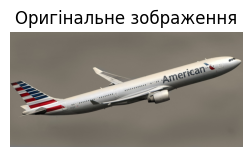

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
На картинці зображено літак із вірогідністю у 99.97%


In [13]:
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import img_to_array
from google.colab import files
import numpy as np
from PIL import Image, ImageEnhance, ImageFilter
import matplotlib.pyplot as plt

# завантаження збереженої та натренованої ШНМ
model = load_model('/content/drive/MyDrive/my_cnn_model5.keras')

# функція попередньої обробки зображення
def preprocess_image(img):
    # конвертація до RGB, якщо потрібно (при чорно-білому форматі)
    if img.mode != 'RGB':
        img = img.convert('RGB')
    img = img.resize((32, 32))  # Зміна розміру до 32x32
    img_array = img_to_array(img)
    img_array = img_array / 255.0
    img_array = np.expand_dims(img_array, axis=0)  #вимір для партії
    return img_array

# функція для додавання Gaussian noise
def add_gaussian_noise(img, mean=0, std=0.1):
    img_array = np.array(img) / 255.0  # нормалізація зображення
    noise = np.random.normal(mean, std, img_array.shape)  # генерація Gaussian noise
    noisy_img_array = np.clip(img_array + noise, 0, 1)  # додавання шуму та обмеження значень
    noisy_img = Image.fromarray((noisy_img_array * 255).astype(np.uint8))  # перетворення назад в зображення
    return noisy_img

# пороги впевненості у прогнозах моделі
confidence_threshold_high = 0.8
confidence_threshold_low = 0.5

# завантаження зображень від користувача через Colab
uploaded = files.upload()

# перебір зображень
for filename in uploaded.keys():
    img = Image.open(filename)

    # виведення оригінального зображення
    plt.figure(figsize=(3, 3))
    plt.imshow(img)
    plt.title("Оригінальне зображення")
    plt.axis('off')
    plt.show()

    # попередня обробка зображення
    img_processed = preprocess_image(img)
    prediction = model.predict(img_processed)

    # отримання прогнозованого класу та впевненості
    predicted_class = np.argmax(prediction)
    confidence = prediction[0][predicted_class]

    # назви класів
    class_labels = ['літак', 'автомобіль', 'птах', 'кішка', 'олень', 'собака', 'жаба', 'кінь', 'корабель', 'вантажівка']

    # перевірка на поріг впевненості (точності)
    if confidence >= confidence_threshold_high:
        print(f'На картинці зображено {class_labels[predicted_class]} із вірогідністю у {confidence * 100:.2f}%')
    elif confidence_threshold_low <= confidence < confidence_threshold_high:
        print(f"Впевненість середня ({confidence * 100:.2f}%). Застосування стандартних фільтрів...")

        # застосування стандартних фільтрів
        filters = [
            ("Контраст", ImageEnhance.Contrast(img).enhance(4)),
            ("Різкість", ImageEnhance.Sharpness(img).enhance(4)),
            ("Колір", ImageEnhance.Color(img).enhance(4)),
            ("Деталізація", img.filter(ImageFilter.DETAIL)),
            ("Додаткова різкість", img.filter(ImageFilter.SHARPEN)),
            ("Згладжування", img.filter(ImageFilter.SMOOTH)),
            ("Розмиття", img.filter(ImageFilter.GaussianBlur(1))),
            ("Накладання фонового коліру", img.convert('L').point(lambda x: x//16*16))
        ]

        # виведення результатів роботи стандартних фільтрів
        fig, axes = plt.subplots(2, 4, figsize=(15, 6))
        axes = axes.flatten()
        for i, (filter_name, filtered_img) in enumerate(filters):
            # Обробка та виведення прогнозу для кожного фільтра
            img_processed = preprocess_image(filtered_img)
            prediction = model.predict(img_processed)
            confidence = prediction[0][np.argmax(prediction)]

            axes[i].imshow(filtered_img)
            axes[i].set_title(f"{filter_name} ({confidence * 100:.2f}%)")
            axes[i].axis('off')
        plt.tight_layout()
        plt.show()

        # повторна перевірка для кожного фільтра
        for filter_name, filtered_img in filters:
            img_processed = preprocess_image(filtered_img)
            prediction = model.predict(img_processed)
            predicted_class = np.argmax(prediction)
            confidence = prediction[0][predicted_class]

            if confidence >= confidence_threshold_high:
                print(f"Фільтр '{filter_name}' допоміг: {class_labels[predicted_class]} із вірогідністю {confidence * 100:.2f}%")
                break
        else:
            print("Зображення не підходить для класифікації навіть після застосування фільтрів.")

    else:
        print(f"Низька впевненість ({confidence * 100:.2f}%). Застосування альтернативних фільтрів...")

        # застосування альтернативних фільтрів (Gaussian noise)
        alternative_filters = [
            ("Gaussian Noise 1", add_gaussian_noise(img, std=0.1)),
            ("Gaussian Noise 2", add_gaussian_noise(img, std=0.3)),
            ("Gaussian Noise 3", add_gaussian_noise(img, std=0.5)),
            ("Gaussian Noise 4", add_gaussian_noise(img, std=0.7)),
            ("Gaussian Noise 5", add_gaussian_noise(img, std=0.9))
        ]

        # виведення результатів роботи альтернативних фільтрів
        fig, axes = plt.subplots(1, 5, figsize=(15, 5))
        axes = axes.flatten()
        for i, (filter_name, filtered_img) in enumerate(alternative_filters):
            # Обробка та виведення прогнозу для кожного фільтра
            img_processed = preprocess_image(filtered_img)
            prediction = model.predict(img_processed)
            confidence = prediction[0][np.argmax(prediction)]

            axes[i].imshow(filtered_img)
            axes[i].set_title(f"{filter_name} ({confidence * 100:.2f}%)")
            axes[i].axis('off')
        plt.tight_layout()
        plt.show()

        # повторна перевірка для кожного альтернативного фільтра
        for filter_name, filtered_img in alternative_filters:
            img_processed = preprocess_image(filtered_img)
            prediction = model.predict(img_processed)
            predicted_class = np.argmax(prediction)
            confidence = prediction[0][predicted_class]

            if confidence >= confidence_threshold_high:
                print(f"Фільтр '{filter_name}' допоміг: {class_labels[predicted_class]} із вірогідністю {confidence * 100:.2f}%")
                break
        else:
            print("Зображення не підходить для класифікації навіть після детальної обробки.")
